# Sentimental Analysis On Online Reviews

### Importing packages

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

### Importing Data

The dataset has been collected https://data.world/datafiniti/grammar-and-online-product-reviews website and is a .csv file consisting of information of over 71,045 online reviews form 1000 different Products provided by Datafiniti's Product Database. The dataset includes the text and title of the review, the name and manufacturer of the product, reviewer metadata, and more.

In [2]:
Online_Reviews_raw= pd.read_csv("Online_Reviews.csv")
Online_Reviews_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71044 entries, 0 to 71043
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    71044 non-null  object 
 1   brand                 71044 non-null  object 
 2   categories            71044 non-null  object 
 3   dateAdded             71044 non-null  object 
 4   dateUpdated           71044 non-null  object 
 5   ean                   39065 non-null  object 
 6   keys                  71044 non-null  object 
 7   manufacturer          70903 non-null  object 
 8   manufacturerNumber    70841 non-null  object 
 9   name                  71044 non-null  object 
 10  reviews.date          70977 non-null  object 
 11  reviews.dateAdded     71044 non-null  object 
 12  reviews.dateSeen      71044 non-null  object 
 13  reviews.didPurchase   32158 non-null  object 
 14  reviews.doRecommend   60429 non-null  object 
 15  reviews.id         

In [3]:
Online_Reviews_raw.head(5)

,id,brand,categories,dateAdded,dateUpdated,ean,keys,manufacturer,manufacturerNumber,name,...,reviews.id,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username,upc
0,AV13O1A8GV-KLJ3akUyj,Universal Music,"Movies, Music & Books,Music,R&b,Movies & TV,Mo...",2017-07-25T00:52:42Z,2018-02-05T08:36:58Z,6.02537E+11,"602537205981,universalmusic/14331328,universal...",Universal Music Group / Cash Money,14331328,Pink Friday: Roman Reloaded Re-Up (w/dvd),...,NaN,0.0,5,https://redsky.target.com/groot-domain-api/v1/...,i love this album. it's very good. more to the...,Just Awesome,Los Angeles,NaN,Joshua,6.02537E+11
1,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",2017-07-25T05:16:03Z,2018-02-05T11:27:45Z,73416000391,lundbergorganiccinnamontoastricecakes/b000fvzw...,Lundberg,574764,Lundberg Organic Cinnamon Toast Rice Cakes,...,100209113.0,NaN,5,https://www.walmart.com/reviews/product/29775278,Good flavor. This review was collected as part...,Good,NaN,NaN,Dorothy W,73416000391
2,AV14LG0R-jtxr-f38QfS,Lundberg,"Food,Packaged Foods,Snacks,Crackers,Snacks, Co...",2017-07-25T05:16:03Z,2018-02-05T11:27:45Z,73416000391,lundbergorganiccinnamontoastricecakes/b000fvzw...,Lundberg,574764,Lundberg Organic Cinnamon Toast Rice Cakes,...,100209113.0,NaN,5,https://www.walmart.com/reviews/product/29775278,Good flavor.,Good,NaN,NaN,Dorothy W,73416000391
3,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",2017-07-25T16:26:19Z,2018-02-05T11:25:51Z,67981934427,"kylovesensualitypleasuregel/b00u2whx8s,0679819...",K-Y,67981934427,K-Y Love Sensuality Pleasure Gel,...,113026909.0,NaN,1,https://www.walmart.com/reviews/product/43383370,I read through the reviews on here before look...,Disappointed,NaN,NaN,Rebecca,67981934427
4,AV16khLE-jtxr-f38VFn,K-Y,"Personal Care,Medicine Cabinet,Lubricant/Sperm...",2017-07-25T16:26:19Z,2018-02-05T11:25:51Z,67981934427,"kylovesensualitypleasuregel/b00u2whx8s,0679819...",K-Y,67981934427,K-Y Love Sensuality Pleasure Gel,...,171267657.0,NaN,1,https://www.walmart.com/reviews/product/43383370,My husband bought this gel for us. The gel cau...,Irritation,NaN,NaN,Walker557,67981934427


In [4]:
Online_Reviews_raw.isnull().sum()

id                          0
brand                       0
categories                  0
dateAdded                   0
dateUpdated                 0
ean                     31979
keys                        0
manufacturer              141
manufacturerNumber        203
name                        0
reviews.date               67
reviews.dateAdded           0
reviews.dateSeen            0
reviews.didPurchase     38886
reviews.doRecommend     10615
reviews.id              38886
reviews.numHelpful      38536
reviews.rating              0
reviews.sourceURLs          0
reviews.text               36
reviews.title             476
reviews.userCity        65634
reviews.userProvince    70595
reviews.username           96
upc                         2
dtype: int64

In [5]:
Online_Reviews_raw.columns = Online_Reviews_raw.columns.str.replace(".", "_")

C:\Users\mviha\AppData\Local\Temp\ipykernel_18056\1538785711.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  Online_Reviews_raw.columns = Online_Reviews_raw.columns.str.replace(".", "_")


In [6]:
Online_Reviews_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71044 entries, 0 to 71043
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    71044 non-null  object 
 1   brand                 71044 non-null  object 
 2   categories            71044 non-null  object 
 3   dateAdded             71044 non-null  object 
 4   dateUpdated           71044 non-null  object 
 5   ean                   39065 non-null  object 
 6   keys                  71044 non-null  object 
 7   manufacturer          70903 non-null  object 
 8   manufacturerNumber    70841 non-null  object 
 9   name                  71044 non-null  object 
 10  reviews_date          70977 non-null  object 
 11  reviews_dateAdded     71044 non-null  object 
 12  reviews_dateSeen      71044 non-null  object 
 13  reviews_didPurchase   32158 non-null  object 
 14  reviews_doRecommend   60429 non-null  object 
 15  reviews_id         

In [7]:
Online_Reviews_raw['seller_name'] = Online_Reviews_raw['reviews_sourceURLs'].apply(lambda a: a.split('.com')[0].split('//')[-1] + '.com')
Online_Reviews_raw['seller_name']= Online_Reviews_raw['seller_name'].apply(lambda b: b.split('.')[-2])

In [8]:
Online_Reviews = Online_Reviews_raw[['id', 'brand', 'name','seller_name', 'reviews_rating', 'reviews_text']].copy()


In [9]:
Online_Reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71044 entries, 0 to 71043
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              71044 non-null  object
 1   brand           71044 non-null  object
 2   name            71044 non-null  object
 3   seller_name     71044 non-null  object
 4   reviews_rating  71044 non-null  int64 
 5   reviews_text    71008 non-null  object
dtypes: int64(1), object(5)
memory usage: 3.3+ MB


In [10]:
Online_Reviews.head(5)

,id,brand,name,seller_name,reviews_rating,reviews_text
0,AV13O1A8GV-KLJ3akUyj,Universal Music,Pink Friday: Roman Reloaded Re-Up (w/dvd),target,5,i love this album. it's very good. more to the...
1,AV14LG0R-jtxr-f38QfS,Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,walmart,5,Good flavor. This review was collected as part...
2,AV14LG0R-jtxr-f38QfS,Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,walmart,5,Good flavor.
3,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,walmart,1,I read through the reviews on here before look...
4,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,walmart,1,My husband bought this gel for us. The gel cau...


In [11]:
Online_Reviews.isnull().sum()

id                 0
brand              0
name               0
seller_name        0
reviews_rating     0
reviews_text      36
dtype: int64

In [12]:
Online_Reviews.dropna(how='any', inplace=True)

In [13]:
Online_Reviews.isnull().sum()

id                0
brand             0
name              0
seller_name       0
reviews_rating    0
reviews_text      0
dtype: int64

### Visualizations

In [14]:
import plotly.express as px

###  Counting the total number of each brand's products

In [15]:
Online_Reviews_5rating= Online_Reviews[Online_Reviews['reviews_rating']==5]
Online_Reviews_1rating= Online_Reviews[Online_Reviews['reviews_rating']==1]

rating5_count =Online_Reviews_5rating["brand"].value_counts()
rating1_count =Online_Reviews_1rating["brand"].value_counts()

### Creating a pie graph showing the brand counts.

### Distribution of 5-star ratings by brand

In [16]:
fig_1 = px.pie(rating5_count,values="brand",names=rating5_count.index)
fig_1.update_traces(textinfo="label+value+percent",textposition='inside')
fig_1.show()

### Distribution of 1-star ratings by brand

In [17]:
fig_2 = px.pie(rating1_count,values="brand",names=rating1_count.index)
fig_2.update_traces(textinfo="label+value+percent",textposition='inside')
fig_2.show()

### Determining the average rating for each brand which has atleast 200 reviews

In [18]:
brand_summ = Online_Reviews.groupby('brand').agg({'reviews_rating': ['mean', 'count']}).reset_index()
brand_summ.columns = ['brand', 'mean_rating', 'total_reviews']
brand_summ = brand_summ[brand_summ['total_reviews'] > 200]
brand_summ

,brand,mean_rating,total_reviews
22,Aveeno,3.807692,442
23,Avery,4.886076,316
53,Burt's Bees,4.630052,965
78,Clear Scalp & Hair Therapy,2.816976,377
80,Clorox,4.825421,10700
96,Disney,4.722914,3692
105,FOX,4.107603,4498
113,Foodsaver,4.310051,587
122,Head & Shoulders,4.307965,565
134,Honeywell,4.290323,310


In [19]:
fig_3 = px.scatter(brand_summ,size='total_reviews', x='mean_rating', y='total_reviews', color='brand',hover_data=['brand'])
fig_3.show()

### Determining the average rating for each seller which has atleast 20 reviews

In [20]:
seller_summ = Online_Reviews.groupby('seller_name').agg({'reviews_rating': 'mean', 'reviews_text': 'count'}).reset_index()
seller_summ.columns = ['seller_name', 'mean_rating', 'total_reviews']
seller_summ=seller_summ[seller_summ["total_reviews"]>20]
fig_4 = px.pie(seller_summ, names='seller_name', values='mean_rating',hover_data=['mean_rating'])
fig_4.update_traces(textinfo='label+value+percent')
fig_4.show()

In [21]:
fig_4 = px.histogram(Online_Reviews, x='reviews_rating', nbins=15, color='seller_name')
fig_4.show()

In [22]:
rating_percentage = 100* Online_Reviews['reviews_rating'].value_counts()/len(Online_Reviews)
rating_percentage

5    65.508112
4    20.549797
3     6.150011
1     5.212089
2     2.579991
Name: reviews_rating, dtype: float64

According to the results, 65.5% of the reviews have five stars, 20.5% have four stars, 6.1% have three stars, 5.2% have one star, and 2.57% have two stars.

###  Getting the number of words by splitting them by a space

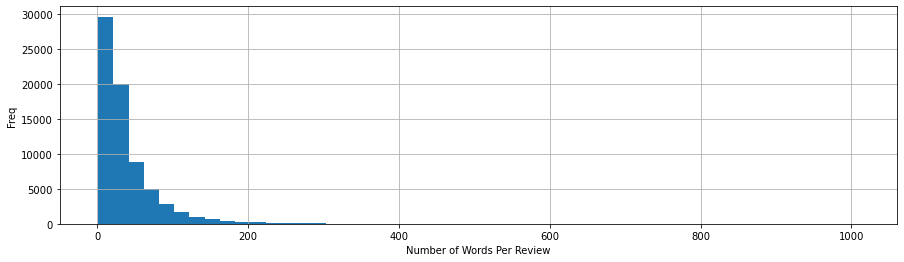

In [23]:
number_of_words_per_review = Online_Reviews.reviews_text.str.split().str.len()
number_of_words_per_review.hist(bins=50, figsize=(15, 4))
plt.xlabel('Number of Words Per Review')
plt.ylabel('Freq')
plt.show() 

The graph is positively skewed and reveals that almost all of the reviews have a total of 250 words, which is very essential for us because we need to know how this dimensional space looks (200 words per review as maximum and 30 words as average review) in order to analyze the reviews.

### NLP- Data Preprocessing

In [24]:
import nltk
nltk.download('punkt') 
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\mviha\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mviha\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [25]:
Reviews = Online_Reviews['reviews_text'].str.cat(sep=' ')
Reviews

'i love this album. it\'s very good. more to the hip hop side than her current pop sound.. SO HYPE! i listen to this everyday at the gym! i give it 5star rating all the way. her metaphors are just crazy. Good flavor. This review was collected as part of a promotion. Good flavor. I read through the reviews on here before looking in to buying one of the couples lubricants, and was ultimately disappointed that it didn\'t even live up to the reviews I had read. For starters, neither my boyfriend nor I could notice any sort of enhanced or \'captivating\' sensation. What we did notice, however, was the messy consistency that was reminiscent of a more liquid-y vaseline. It was difficult to clean up, and was not a pleasant, especially since it lacked the \'captivating\' sensation we had both been expecting. I\'m disappointed that I paid as much as I did for a lube that I won\'t use again, when I could just use their normal personal lubricant for 1) less money and 2) less mess. My husband bough

In [26]:
from nltk import word_tokenize

In [27]:
#function to split text into word
tokens = word_tokenize(Reviews)


 ### Identifying the most commonly used words in the reviews

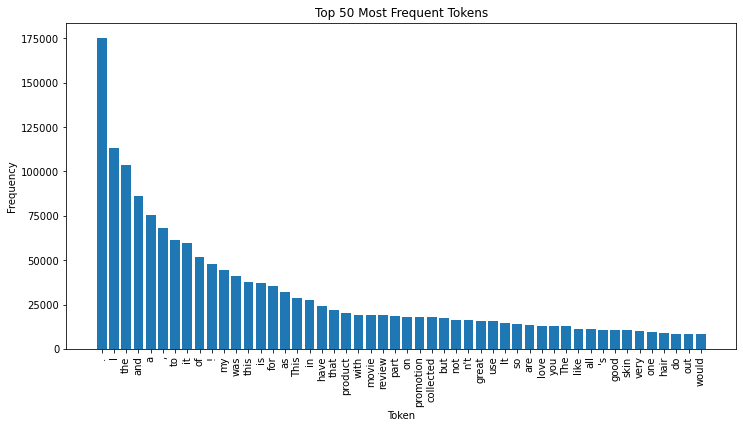

In [28]:
frequency_dist = nltk.FreqDist(tokens)
top_50_tokens=sorted(frequency_dist,key=frequency_dist.__getitem__, reverse=True)[0:50]
# Create a bar chart
plt.figure(figsize=(12,6))
plt.bar(top_50_tokens, [frequency_dist[token] for token in top_50_tokens])
plt.xticks(rotation=90)
plt.xlabel('Token')
plt.ylabel('Frequency')
plt.title('Top 50 Most Frequent Tokens')
plt.show()

Transforming all of the ratings into binary values for sentiment analysis:

    Ratings of 4 or 5 will be mapped to 1 and associated with positive reviews.
    Ratings of 1 or 2 will be mapped to 0 and associated with negative reviews.
    Ratings of 3 will be eliminated because they represent neutral recommendations.

In [29]:
Online_Reviews['Sentiment'] = np.where(Online_Reviews.reviews_rating > 3,1,0)

In [30]:
Online_Reviews = Online_Reviews[Online_Reviews.reviews_rating != 3]  # Removing neutral reviews.

In [31]:
Online_Reviews

,id,brand,name,seller_name,reviews_rating,reviews_text,Sentiment
0,AV13O1A8GV-KLJ3akUyj,Universal Music,Pink Friday: Roman Reloaded Re-Up (w/dvd),target,5,i love this album. it's very good. more to the...,1
1,AV14LG0R-jtxr-f38QfS,Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,walmart,5,Good flavor. This review was collected as part...,1
2,AV14LG0R-jtxr-f38QfS,Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,walmart,5,Good flavor.,1
3,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,walmart,1,I read through the reviews on here before look...,0
4,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,walmart,1,My husband bought this gel for us. The gel cau...,0
...,...,...,...,...,...,...,...
71039,AVzRGDlw-jtxr-f3yfFH,Opti-Free,Opti-Free Puremoist Disinfecting Solution 10fl Oz,walmart,5,I'm dealing with dry eyes and very sensitive t...,1
71040,AVzRGDlw-jtxr-f3yfFH,Opti-Free,Opti-Free Puremoist Disinfecting Solution 10fl Oz,walmart,5,Great stuff! Helps keep my contacts moist all ...,1
71041,AVzRGDlw-jtxr-f3yfFH,Opti-Free,Opti-Free Puremoist Disinfecting Solution 10fl Oz,walmart,5,Right price,1
71042,AVzvTLfivKc47QAVfPme,Bebe Au Lait,Bebe Au Lait174 Premium Muslin Nursing Scarf -...,target,5,I was so pleased when this scarf arrived for m...,1


In [32]:
Online_Reviews['Sentiment'].value_counts()

1    61108
0     5533
Name: Sentiment, dtype: int64

### Converting text reviews to lowercase:

In [33]:
Online_Reviews['lowercase_text_reviews'] = Online_Reviews['reviews_text'].str.lower()

####  Number of tokens before converting reviews to lowercase

In [34]:
token_list_before = [word_tokenize(i) for i in Online_Reviews['reviews_text']]
tokens = []
for sublist in token_list_before:
    for item in sublist:
        tokens.append(item)
print("Number of unique tokens then: ", len(set(tokens)))

Number of unique tokens then:  40322


#### Number of tokens after converting reviews to lowercase

In [35]:
token_list_before = [word_tokenize(i) for i in Online_Reviews['lowercase_text_reviews']]
tokens = []
for sublist in token_list_before:
    for item in sublist:
        tokens.append(item)
print("Number of unique tokens then: ", len(set(tokens)))

Number of unique tokens then:  32497


### Removing special characters

In [36]:
spl_chars = []
for review in Online_Reviews['lowercase_text_reviews']:
    chars = []
    for char in list(review):
        if not char.isalnum() and char != ' ':
            chars.append(char)
    spl_chars.append(chars)

In [37]:
Online_Reviews_old = Online_Reviews.copy()

In [38]:
print("Old Review: " + Online_Reviews_old['lowercase_text_reviews'][100])


Old Review: great product...no oily feeling...would recommend. this review was collected as part of a promotion.


###  removing the special characters

In [39]:
 Online_Reviews['lowercase_text_reviews'] = Online_Reviews['lowercase_text_reviews'].str.replace(r'[^A-Za-z0-9 ]+', ' ')

C:\Users\mviha\AppData\Local\Temp\ipykernel_18056\1845484409.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [40]:
print("New Review : " + Online_Reviews['lowercase_text_reviews'][100])

New Review : great product no oily feeling would recommend  this review was collected as part of a promotion 


In [41]:
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mviha\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [42]:
stop_words = stopwords.words('english')

In [43]:
def remove_stopwords(stop_words, sentence):
    return [word for word in nltk.word_tokenize(sentence) if word not in stop_words]

Online_Reviews['withoutstop_words'] = Online_Reviews['lowercase_text_reviews'].apply(lambda row: remove_stopwords(stop_words, row))
Online_Reviews[['lowercase_text_reviews','withoutstop_words']]

,lowercase_text_reviews,withoutstop_words
0,i love this album it s very good more to the...,"[love, album, good, hip, hop, side, current, p..."
1,good flavor this review was collected as part...,"[good, flavor, review, collected, part, promot..."
2,good flavor,"[good, flavor]"
3,i read through the reviews on here before look...,"[read, reviews, looking, buying, one, couples,..."
4,my husband bought this gel for us the gel cau...,"[husband, bought, gel, us, gel, caused, irrita..."
...,...,...
71039,i m dealing with dry eyes and very sensitive t...,"[dealing, dry, eyes, sensitive, products, eye,..."
71040,great stuff helps keep my contacts moist all ...,"[great, stuff, helps, keep, contacts, moist, day]"
71041,right price,"[right, price]"
71042,i was so pleased when this scarf arrived for m...,"[pleased, scarf, arrived, multiple, reasons, p..."


In [44]:
Online_Reviews

,id,brand,name,seller_name,reviews_rating,reviews_text,Sentiment,lowercase_text_reviews,withoutstop_words
0,AV13O1A8GV-KLJ3akUyj,Universal Music,Pink Friday: Roman Reloaded Re-Up (w/dvd),target,5,i love this album. it's very good. more to the...,1,i love this album it s very good more to the...,"[love, album, good, hip, hop, side, current, p..."
1,AV14LG0R-jtxr-f38QfS,Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,walmart,5,Good flavor. This review was collected as part...,1,good flavor this review was collected as part...,"[good, flavor, review, collected, part, promot..."
2,AV14LG0R-jtxr-f38QfS,Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,walmart,5,Good flavor.,1,good flavor,"[good, flavor]"
3,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,walmart,1,I read through the reviews on here before look...,0,i read through the reviews on here before look...,"[read, reviews, looking, buying, one, couples,..."
4,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,walmart,1,My husband bought this gel for us. The gel cau...,0,my husband bought this gel for us the gel cau...,"[husband, bought, gel, us, gel, caused, irrita..."
...,...,...,...,...,...,...,...,...,...
71039,AVzRGDlw-jtxr-f3yfFH,Opti-Free,Opti-Free Puremoist Disinfecting Solution 10fl Oz,walmart,5,I'm dealing with dry eyes and very sensitive t...,1,i m dealing with dry eyes and very sensitive t...,"[dealing, dry, eyes, sensitive, products, eye,..."
71040,AVzRGDlw-jtxr-f3yfFH,Opti-Free,Opti-Free Puremoist Disinfecting Solution 10fl Oz,walmart,5,Great stuff! Helps keep my contacts moist all ...,1,great stuff helps keep my contacts moist all ...,"[great, stuff, helps, keep, contacts, moist, day]"
71041,AVzRGDlw-jtxr-f3yfFH,Opti-Free,Opti-Free Puremoist Disinfecting Solution 10fl Oz,walmart,5,Right price,1,right price,"[right, price]"
71042,AVzvTLfivKc47QAVfPme,Bebe Au Lait,Bebe Au Lait174 Premium Muslin Nursing Scarf -...,target,5,I was so pleased when this scarf arrived for m...,1,i was so pleased when this scarf arrived for m...,"[pleased, scarf, arrived, multiple, reasons, p..."


### Stemming

In [45]:
from nltk.stem import PorterStemmer
porter = PorterStemmer()

In [46]:
def stemming(sentence):
    tokenized_words=word_tokenize(sentence)
    stemmed_words=[]
    for word in tokenized_words:
        stemmed_words.append(porter.stem(word))
        stemmed_words.append(" ")
    return "".join(stemmed_words)

Online_Reviews['stemmed_words'] = Online_Reviews['withoutstop_words'].apply(lambda x: [stemming(y) for y in x])
Online_Reviews[['withoutstop_words','stemmed_words']]

,withoutstop_words,stemmed_words
0,"[love, album, good, hip, hop, side, current, p...","[love , album , good , hip , hop , side , curr..."
1,"[good, flavor, review, collected, part, promot...","[good , flavor , review , collect , part , pro..."
2,"[good, flavor]","[good , flavor ]"
3,"[read, reviews, looking, buying, one, couples,...","[read , review , look , buy , one , coupl , lu..."
4,"[husband, bought, gel, us, gel, caused, irrita...","[husband , bought , gel , us , gel , caus , ir..."
...,...,...
71039,"[dealing, dry, eyes, sensitive, products, eye,...","[deal , dri , eye , sensit , product , eye , c..."
71040,"[great, stuff, helps, keep, contacts, moist, day]","[great , stuff , help , keep , contact , moist..."
71041,"[right, price]","[right , price ]"
71042,"[pleased, scarf, arrived, multiple, reasons, p...","[pleas , scarf , arriv , multipl , reason , pr..."


#### lemmatization

In [47]:
from nltk.stem import LancasterStemmer
lancaster = LancasterStemmer()

In [48]:
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()

In [49]:
def lemmatization(sentence):
    tokenized_words=word_tokenize(sentence)
    lemmatized_words=[]
    for word in tokenized_words:
        lemmatized_words.append(lemmatizer.lemmatize(word, pos="v"))
        lemmatized_words.append(" ")
    return "".join(lemmatized_words)

Online_Reviews['lemmatized_words'] = Online_Reviews['withoutstop_words'].apply(lambda x: [lemmatization(y) for y in x])
Online_Reviews[['withoutstop_words','lemmatized_words']]

,withoutstop_words,lemmatized_words
0,"[love, album, good, hip, hop, side, current, p...","[love , album , good , hip , hop , side , curr..."
1,"[good, flavor, review, collected, part, promot...","[good , flavor , review , collect , part , pro..."
2,"[good, flavor]","[good , flavor ]"
3,"[read, reviews, looking, buying, one, couples,...","[read , review , look , buy , one , couple , l..."
4,"[husband, bought, gel, us, gel, caused, irrita...","[husband , buy , gel , us , gel , cause , irri..."
...,...,...
71039,"[dealing, dry, eyes, sensitive, products, eye,...","[deal , dry , eye , sensitive , products , eye..."
71040,"[great, stuff, helps, keep, contacts, moist, day]","[great , stuff , help , keep , contact , moist..."
71041,"[right, price]","[right , price ]"
71042,"[pleased, scarf, arrived, multiple, reasons, p...","[please , scarf , arrive , multiple , reason ,..."


In [50]:
Online_Reviews

,id,brand,name,seller_name,reviews_rating,reviews_text,Sentiment,lowercase_text_reviews,withoutstop_words,stemmed_words,lemmatized_words
0,AV13O1A8GV-KLJ3akUyj,Universal Music,Pink Friday: Roman Reloaded Re-Up (w/dvd),target,5,i love this album. it's very good. more to the...,1,i love this album it s very good more to the...,"[love, album, good, hip, hop, side, current, p...","[love , album , good , hip , hop , side , curr...","[love , album , good , hip , hop , side , curr..."
1,AV14LG0R-jtxr-f38QfS,Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,walmart,5,Good flavor. This review was collected as part...,1,good flavor this review was collected as part...,"[good, flavor, review, collected, part, promot...","[good , flavor , review , collect , part , pro...","[good , flavor , review , collect , part , pro..."
2,AV14LG0R-jtxr-f38QfS,Lundberg,Lundberg Organic Cinnamon Toast Rice Cakes,walmart,5,Good flavor.,1,good flavor,"[good, flavor]","[good , flavor ]","[good , flavor ]"
3,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,walmart,1,I read through the reviews on here before look...,0,i read through the reviews on here before look...,"[read, reviews, looking, buying, one, couples,...","[read , review , look , buy , one , coupl , lu...","[read , review , look , buy , one , couple , l..."
4,AV16khLE-jtxr-f38VFn,K-Y,K-Y Love Sensuality Pleasure Gel,walmart,1,My husband bought this gel for us. The gel cau...,0,my husband bought this gel for us the gel cau...,"[husband, bought, gel, us, gel, caused, irrita...","[husband , bought , gel , us , gel , caus , ir...","[husband , buy , gel , us , gel , cause , irri..."
...,...,...,...,...,...,...,...,...,...,...,...
71039,AVzRGDlw-jtxr-f3yfFH,Opti-Free,Opti-Free Puremoist Disinfecting Solution 10fl Oz,walmart,5,I'm dealing with dry eyes and very sensitive t...,1,i m dealing with dry eyes and very sensitive t...,"[dealing, dry, eyes, sensitive, products, eye,...","[deal , dri , eye , sensit , product , eye , c...","[deal , dry , eye , sensitive , products , eye..."
71040,AVzRGDlw-jtxr-f3yfFH,Opti-Free,Opti-Free Puremoist Disinfecting Solution 10fl Oz,walmart,5,Great stuff! Helps keep my contacts moist all ...,1,great stuff helps keep my contacts moist all ...,"[great, stuff, helps, keep, contacts, moist, day]","[great , stuff , help , keep , contact , moist...","[great , stuff , help , keep , contact , moist..."
71041,AVzRGDlw-jtxr-f3yfFH,Opti-Free,Opti-Free Puremoist Disinfecting Solution 10fl Oz,walmart,5,Right price,1,right price,"[right, price]","[right , price ]","[right , price ]"
71042,AVzvTLfivKc47QAVfPme,Bebe Au Lait,Bebe Au Lait174 Premium Muslin Nursing Scarf -...,target,5,I was so pleased when this scarf arrived for m...,1,i was so pleased when this scarf arrived for m...,"[pleased, scarf, arrived, multiple, reasons, p...","[pleas , scarf , arriv , multipl , reason , pr...","[please , scarf , arrive , multiple , reason ,..."


### Topic Modelling

In [116]:
from sklearn.decomposition import LatentDirichletAllocation

In [117]:
vectorizer = CountVectorizer(tokenizer=word_tokenize, stop_words=stop_words)
td_matrix = vectorizer.fit_transform(Online_Reviews['lowercase_text_reviews'])

C:\Users\mviha\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:396: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ["'d", "'ll", "'re", "'s", "'ve", 'could', 'might', 'must', "n't", 'need', 'sha', 'wo', 'would'] not in stop_words.



In [118]:
lda = LatentDirichletAllocation(n_components=5, random_state=0)
lda.fit(td_matrix)

LatentDirichletAllocation(n_components=5, random_state=0)

In [119]:
# Print top words for each topic
def print_top_words(model, feature_names, n_top_words=15):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx}:")
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-n_top_words - 1:-1]]))
    print()

In [120]:
print_top_words(lda, vectorizer.get_feature_names(), n_top_words=15)

# Assign topics to reviews
topic_assignments = lda.transform(td_matrix)
Online_Reviews['topic'] = np.argmax(topic_assignments, axis=1)

Topic 0:
hair product review part conditioner promotion collected love like received soft shampoo great free used
Topic 1:
part review promotion collected use love clean wipes great product tide clorox easy clothes smell
Topic 2:
skin product review part promotion collected moisturizer face using use like olay feel really love
Topic 3:
use one product great mop like love bought would used get time spray easy well
Topic 4:
movie great good kids one family love watch funny loved movies really enjoyed first godzilla



## Bag of Words Model

In [121]:
from sklearn.feature_extraction.text import CountVectorizer

#### converting reviews to a matrix of token counts

In [122]:
vector = CountVectorizer()
Matrix = vector.fit_transform(Online_Reviews['lowercase_text_reviews'])
vector_df = pd.DataFrame(Matrix.toarray(), columns = vector.get_feature_names())
vector_df

,00,000,0000,000x,007,02,04,05,06,07,...,zoom,zootopia,zorbas,zow,zre,zucchetta,zucchini,zumba,zyliss,zyrtec
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66636,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66637,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66638,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
66639,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [53]:
bow_ct = CountVectorizer(tokenizer= word_tokenize,stop_words=stop_words,ngram_range=(1,3)) 
bow_data = bow_ct.fit_transform(Online_Reviews['lowercase_text_reviews'])
bow_data

C:\Users\mviha\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:396: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ["'d", "'ll", "'re", "'s", "'ve", 'could', 'might', 'must', "n't", 'need', 'sha', 'wo', 'would'] not in stop_words.



<66641x1303171 sparse matrix of type '<class 'numpy.int64'>'
	with 3546540 stored elements in Compressed Sparse Row format>

In [54]:
from sklearn.model_selection import train_test_split

In [55]:
X_train_bow, X_test_bow, y_train_bow, y_test_bow = train_test_split(bow_data,Online_Reviews['Sentiment'],test_size = 0.25)

####  Logistic regression

In [56]:
from sklearn.linear_model import LogisticRegression


In [57]:
logregg = LogisticRegression()
logregg.fit(X_train_bow, y_train_bow) 

C:\Users\mviha\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [58]:
from sklearn.metrics import f1_score

In [59]:
logregg_pred = logregg.predict(X_test_bow) 

In [60]:
print("f1 score for the model logistic_Regression : ", f1_score(y_test_bow, logregg_pred))

f1 score for the model logistic_Regression :  0.9817910834629342


#### RandomForestClassifier

In [61]:
from sklearn.ensemble import RandomForestClassifier

In [62]:
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_bow, y_train_bow)

RandomForestClassifier(random_state=42)

In [63]:
rf_pred = rf.predict(X_test_bow)

In [64]:
print("f1 score: ", f1_score(y_test_bow,rf_pred))

f1 score:  0.972107997832393


#### Word Embeddings Model

#### source : https://nlp.stanford.edu/projects/glove/

In [65]:
import gensim
import os

In [66]:
# Load pre-trained GloVe model
model_path = os.path.join(os.getcwd(),'glove.42B.300d.txt')

In [67]:
model = gensim.models.KeyedVectors.load_word2vec_format(model_path, binary=False, no_header=True)

In [68]:
review_embed = [np.mean([model[i.lower()] for i in word_tokenize(review) if i.lower() in model], axis=0)
    if len([word for word in word_tokenize(review) if word.lower() in model]) > 0
    else np.zeros(model.vector_size)
    for review in Online_Reviews['lowercase_text_reviews']]
embed_data = pd.DataFrame(review_embed)

In [69]:
embed_data = embed_data.fillna(0)
embed_data

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,0.084472,0.006689,-0.030360,-0.023078,0.114714,-0.030096,-3.543177,0.063921,-0.044364,-0.466326,...,0.015356,-0.136490,-0.167926,0.014822,0.042434,0.075543,-0.092296,-0.087358,0.075571,0.083943
1,0.006620,0.155284,0.050900,-0.143476,0.361350,-0.187796,-3.327837,0.379316,-0.183479,-0.332947,...,-0.109184,-0.053782,-0.073997,0.013061,0.110625,0.008677,-0.087000,-0.083884,-0.118944,0.056691
2,-0.117517,0.145745,0.361120,-0.177808,0.653885,-0.314230,-3.131000,0.128090,-0.222540,-0.922825,...,-0.434730,-0.379955,0.225732,0.425675,0.543885,0.208977,-0.414850,-0.402450,-0.019839,0.105304
3,-0.055465,-0.015274,-0.081501,-0.127692,0.108524,-0.040868,-3.521162,0.251690,0.032892,-0.490006,...,-0.018850,-0.125914,-0.106902,-0.033968,0.097602,0.006678,-0.001957,-0.092296,0.017657,-0.048639
4,-0.079086,-0.031289,-0.098909,-0.134346,0.193464,-0.155696,-3.289908,0.282952,-0.107354,-0.637257,...,0.000952,-0.118683,-0.126174,-0.102727,0.139136,0.034631,-0.017657,-0.239479,-0.028623,0.041141
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66636,-0.035993,0.005894,-0.070501,-0.135417,0.180412,0.020753,-3.663653,0.273143,0.059003,-0.470564,...,-0.037995,-0.158815,-0.040988,-0.121511,0.066875,-0.009848,0.009759,-0.095551,0.076208,0.022629
66637,0.015176,0.059635,-0.078321,-0.338198,0.166626,-0.068326,-3.375389,-0.030400,-0.026978,-0.468171,...,-0.060907,0.007270,-0.116024,-0.202493,0.038875,0.063515,-0.074470,0.007896,-0.072332,0.089074
66638,0.064952,0.059367,-0.109067,-0.259950,0.404300,-0.214533,-3.214650,0.291120,-0.172155,-0.558130,...,-0.340420,0.322485,-0.065600,0.077256,0.093956,0.029065,-0.156420,-0.258429,0.341340,0.001826
66639,0.017964,-0.065302,-0.113183,-0.189686,0.172825,-0.046762,-3.459496,0.154399,-0.006493,-0.489411,...,-0.012438,-0.146012,-0.105633,-0.039317,0.034064,0.088318,-0.006881,-0.161544,0.087350,-0.003968


In [70]:
X_train_embed, X_test_embed, y_train_embed, y_test_embed = train_test_split(embed_data,Online_Reviews['Sentiment'],test_size = 0.20)

In [71]:
logregg_2 = LogisticRegression()

In [72]:
logregg_2.fit(X_train_embed, y_train_embed)
WE_logregg_pred = logregg_2.predict(X_test_embed)

print("f1 score for we: ",f1_score(y_test_embed, WE_logregg_pred))

f1 score for we:  0.9719603577471598


C:\Users\mviha\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



### Creating Web page using streamlit

In [73]:
import joblib

# save trained logistic regression model
joblib.dump(logregg, 'logregg.joblib')

# save CountVectorizer object
joblib.dump(bow_ct, 'bow_ct.joblib')


['bow_ct.joblib']

In [76]:
# function to preprocess user input
def preprocess_input(input_str):
    lowercase_str = input_str.lower() # convert to lowercase
    tokenized_str = word_tokenize(lowercase_str) # tokenize words
    return ' '.join(tokenized_str) # join tokenized words with spaces

# take user input
user_input = input("Enter your review: ")

# preprocess user input
preprocessed_input = preprocess_input(user_input)

# create bag-of-words representation of user input
input_bow = bow_ct.transform([preprocessed_input])

# predict sentiment rating
sentiment_prediction = logregg.predict(input_bow)

# print predicted sentiment rating
print("Predicted sentiment rating: ", sentiment_prediction[0])


Enter your review: This chair is by no means ergonomic. I have found since receiving that this has absolutely screwed up my back, with constant knots. I have actually given myself whiplash with this chair considering there is absolutely no neck support...it only comes up to the middle of my back (I'm 5'8"). I use this chair for when I work overnight and there are times that I will fall start to asleep in it, and I end up catching myself when I start to nod my head and whack I end up popping my neck bad enough to give myself whiplash. Last time I did it I ended up with bad shoulder pains for several weeks. If you want something decent to sit in for 8 hrs (or longer) find something better. I guess having paid what little I did for this chair should have been my first red flag. I've had to add a padded cushion to the seat because what it comes with is NOT comfy at all, as well as draping a blanket over the back for additional cushion. At least my upper back/shoulder pain has subsided and 